In [1]:
import os
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
from torchvision import datasets, models
from torch.utils.data import DataLoader
from tqdm import tqdm
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cuda


In [3]:
#################################
# PART 2: Fake-vs-Real Classifier
#################################

# Data transforms for classification
cat_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)  # since CIFAR-style images are less saturated
])

# Load dataset
data_dir = './data/cats_real_fake'

train_dataset = datasets.ImageFolder(os.path.join(data_dir, 'train'), transform=cat_transforms)
val_dataset = datasets.ImageFolder(os.path.join(data_dir, 'val'), transform=cat_transforms)

# Combine and split into train/val
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, pin_memory=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, pin_memory=True, num_workers=4)


# Define model
model_cat = models.resnet18(pretrained=True)
model_cat.fc = nn.Linear(model_cat.fc.in_features, 2)
model_cat = model_cat.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer_cat = torch.optim.Adam(model_cat.parameters(), lr=1e-4)

# Train loop
from tqdm import tqdm

def train_fake_vs_real(model, train_loader, val_loader, epochs=10):
    for epoch in range(epochs):
        model.train()
        total_loss = 0
        train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} [Train]", leave=False)

        for inputs, labels in train_bar:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer_cat.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer_cat.step()
            total_loss += loss.item()
            train_bar.set_postfix(loss=loss.item())

        print(f"📘 Epoch {epoch+1}: Avg Train Loss = {total_loss/len(train_loader):.4f}")

        # Validation
        model.eval()
        correct = 0
        total = 0
        val_bar = tqdm(val_loader, desc=f"Epoch {epoch+1}/{epochs} [Val]  ", leave=False)
        with torch.no_grad():
            for inputs, labels in val_bar:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                correct += (preds == labels).sum().item()
                total += labels.size(0)
        print(f"✅ Epoch {epoch+1}: Validation Accuracy = {correct/total:.4f}")

# Optional: Faster DataLoader config


# Run training
train_fake_vs_real(model_cat, train_loader, val_loader)

/home/aj3246/XAI/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/aj3246/XAI/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


📘 Epoch 1: Avg Train Loss = 0.5084


✅ Epoch 1: Validation Accuracy = 0.8900


📘 Epoch 2: Avg Train Loss = 0.0417


✅ Epoch 2: Validation Accuracy = 0.9200


📘 Epoch 3: Avg Train Loss = 0.0199


✅ Epoch 3: Validation Accuracy = 0.9400


📘 Epoch 4: Avg Train Loss = 0.0052


✅ Epoch 4: Validation Accuracy = 0.9300


📘 Epoch 5: Avg Train Loss = 0.0047


✅ Epoch 5: Validation Accuracy = 0.9300


📘 Epoch 6: Avg Train Loss = 0.0024


✅ Epoch 6: Validation Accuracy = 0.9200


📘 Epoch 7: Avg Train Loss = 0.0027


✅ Epoch 7: Validation Accuracy = 0.9200


📘 Epoch 8: Avg Train Loss = 0.0015


✅ Epoch 8: Validation Accuracy = 0.9300


📘 Epoch 9: Avg Train Loss = 0.0036


✅ Epoch 9: Validation Accuracy = 0.9300


📘 Epoch 10: Avg Train Loss = 0.0012


✅ Epoch 10: Validation Accuracy = 0.9300


In [4]:
torch.save(model_cat.state_dict(), "resnet18_cat.pth")


📊 Classification Report:
              precision    recall  f1-score   support

        real       0.94      0.92      0.93        50
        fake       0.92      0.94      0.93        50

    accuracy                           0.93       100
   macro avg       0.93      0.93      0.93       100
weighted avg       0.93      0.93      0.93       100



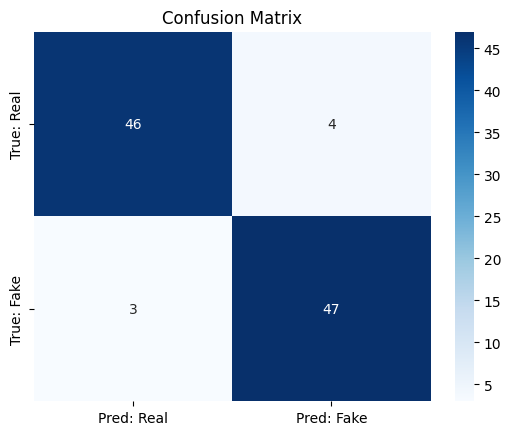

In [5]:
#################################
# PART 2: Evaluation Report
#################################

from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate_model(model, val_loader):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    print("📊 Classification Report:")
    print(classification_report(all_labels, all_preds, target_names=['real', 'fake']))

    cm = confusion_matrix(all_labels, all_preds)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Pred: Real', 'Pred: Fake'],
                yticklabels=['True: Real', 'True: Fake'])
    plt.title("Confusion Matrix")
    plt.show()

# Call the evaluator
evaluate_model(model_cat, val_loader)


In [50]:
import copy

# Create a deep copy of the trained model
model_cat_copy = copy.deepcopy(model_cat)


In [6]:
def get_misclassified_indices(model, dataloader, true_label, predicted_label):
    model.eval()
    misclassified = []

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloader):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            preds = torch.argmax(outputs, dim=1)

            for j in range(len(labels)):
                if labels[j].item() == true_label and preds[j].item() == predicted_label:
                    abs_idx = i * dataloader.batch_size + j
                    misclassified.append(abs_idx)
    return misclassified


In [6]:
misclassified_real_as_fake = get_misclassified_indices(model_cat, val_loader, true_label=0, predicted_label=1)
print(f"Real classified as Fake: {len(misclassified_real_as_fake)}")

misclassified_fake_as_real = get_misclassified_indices(model_cat, val_loader, true_label=1, predicted_label=0)
print(f"Fake classified as Real: {len(misclassified_fake_as_real)}")


Real classified as Fake: 6
Fake classified as Real: 3


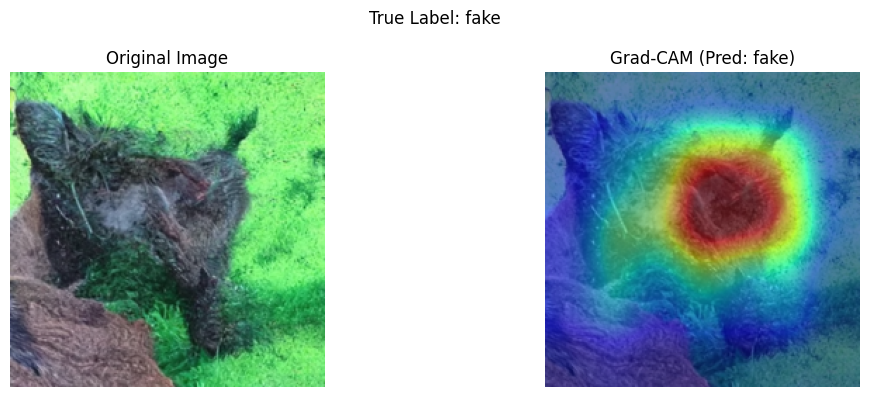

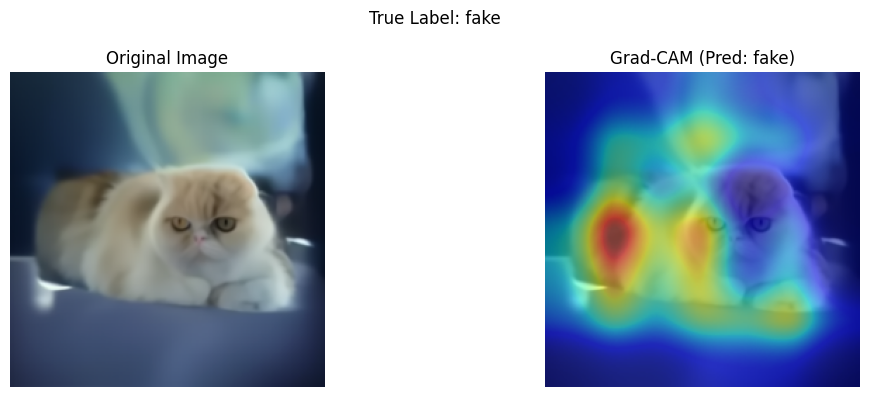

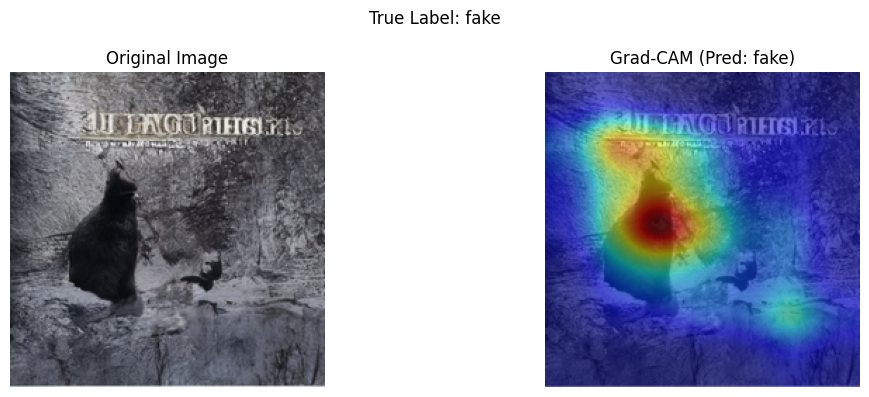

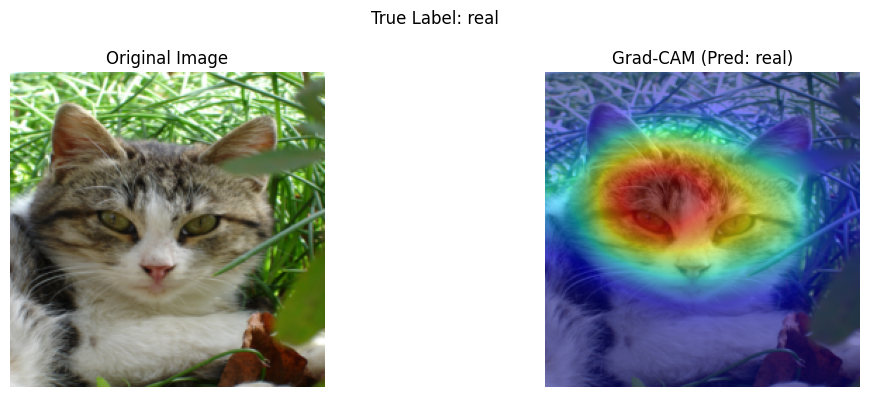

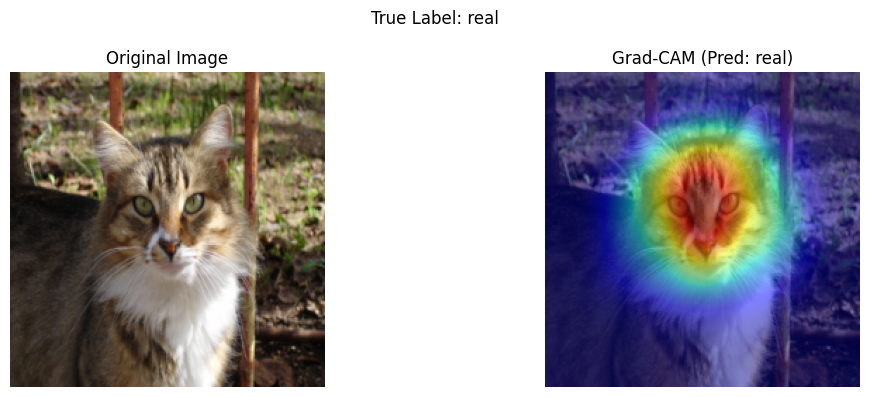

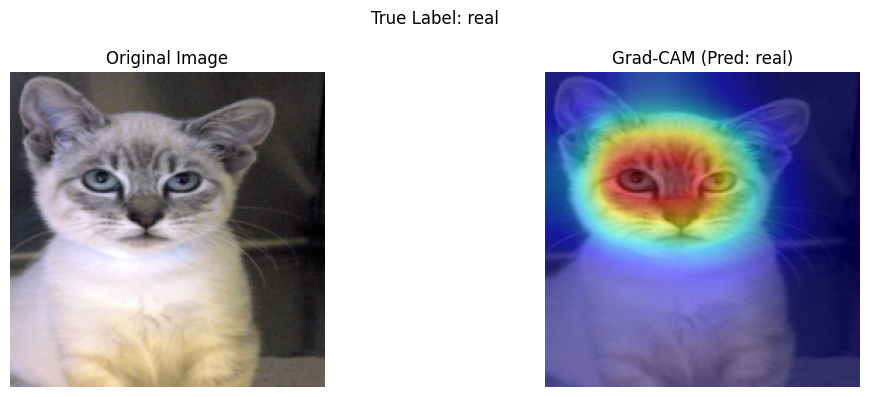

In [7]:
# PART 2: Grad-CAM Visualization for Fake-vs-Real Classifier
from torchcam.methods import GradCAM
from torchcam.utils import overlay_mask
from torchvision.transforms.functional import to_pil_image
from torchvision.utils import make_grid

cam_extractor_cat = GradCAM(model_cat, target_layer="layer4")

def show_gradcam_cat(model, dataloader, class_names, num_per_class=3):
    model.eval()
    shown_per_class = {cls: 0 for cls in range(len(class_names))}
    max_total = num_per_class * len(class_names)

    for inputs, labels in dataloader:
        inputs, labels = inputs.to(device), labels.to(device)

        for i in range(inputs.size(0)):
            label = labels[i].item()
            if shown_per_class[label] >= num_per_class:
                continue

            input_img = inputs[i].unsqueeze(0).to(device).requires_grad_()
            outputs = model(input_img)
            pred_class = outputs.argmax(1).item()

            cam = cam_extractor_cat(pred_class, outputs)
            cam_img = cam[0].detach().cpu()

            if cam_img.ndim == 3 and cam_img.shape[0] > 1:
                cam_img = cam_img.mean(dim=0, keepdim=True)

            # Unnormalize image for visualization
            img = inputs[i].cpu()
            img = img * 0.5 + 0.5  # Undo normalization ([0.5]*3 mean/std)
            img = torch.clamp(img, 0, 1)

            orig_img = to_pil_image(img)
            cam_overlay = overlay_mask(orig_img, to_pil_image(cam_img.squeeze(0), mode='F'), alpha=0.5)

            # Plot side-by-side with raw image
            fig, axs = plt.subplots(1, 2, figsize=(12, 4))
            axs[0].imshow(orig_img)
            axs[0].set_title("Original Image")
            axs[1].imshow(cam_overlay)
            axs[1].set_title(f"Grad-CAM (Pred: {class_names[pred_class]})")

            for ax in axs:
                ax.axis('off')
            plt.suptitle(f"True Label: {class_names[label]}")
            plt.tight_layout()
            filename = f"gradcam_outputs/sample_{class_names[label]}_{shown_per_class[label]}.png"
            fig.savefig(filename, bbox_inches='tight')
            plt.show()

            shown_per_class[label] += 1
            if sum(shown_per_class.values()) >= max_total:
                return

# Call after model_cat is trained
show_gradcam_cat(model_cat, val_loader, ['fake', 'real'])

In [8]:
# This line disables the GradCAM extractor if previously used
cam_extractor_cat._hooks_enabled = False


In [9]:
# Penultimate layer activations
feature_extractor = {}

def hook_fn(module, input, output):
    feature_extractor['features'] = output.flatten(1).detach()

# Register hook on the layer before the final fc
hook_handle = model_cat.avgpool.register_forward_hook(hook_fn)


In [10]:
import numpy as np
def get_embeddings(model, dataloader):
    model.eval()
    embeddings = []
    labels = []
    images = []

    with torch.no_grad():
        for inputs, targets in tqdm(dataloader, desc="Extracting Embeddings"):
            inputs = inputs.to(device)
            _ = model(inputs)  # trigger hook
            emb = feature_extractor['features'].cpu().numpy()
            embeddings.append(emb)
            labels.extend(targets.numpy())
            images.extend(inputs.cpu())

    embeddings = np.concatenate(embeddings, axis=0)
    return embeddings, np.array(labels), images


In [11]:
train_embeddings, train_labels, train_images = get_embeddings(model_cat, train_loader)
test_embeddings, test_labels, test_images = get_embeddings(model_cat, val_loader)


Extracting Embeddings: 100%|██████████| 4/4 [00:00<00:00,  8.38it/s]


In [15]:
import pickle

with open("embeddings.pkl", "wb") as f:
    pickle.dump({
        "train_embeddings": train_embeddings,
        "train_labels": train_labels,
        "train_images": train_images,
        "test_embeddings": test_embeddings,
        "test_labels": test_labels,
        "test_images": test_images
    }, f)


In [12]:
from sklearn.metrics.pairwise import cosine_distances
def show_twin_system_twins_only(test_idx, test_embeddings, test_images,
                                train_embeddings, train_labels, train_images,
                                model, class_names=['real', 'fake'], k_twins=3):

    true_label = test_labels[test_idx]  # 👈 correct true label

    query_emb = test_embeddings[test_idx].reshape(1, -1)
    query_img_tensor = test_images[test_idx]
    query_pred = model(query_img_tensor.unsqueeze(0).to(device)).argmax(1).item()

    # Compute cosine distances
    distances = cosine_distances(query_emb, train_embeddings)[0]

    # Get k nearest twins (same class)
    same_class_idxs = np.where(train_labels == query_pred)[0]
    nearest_same = same_class_idxs[np.argsort(distances[same_class_idxs])[:k_twins]]

    # Build panel: [query + k_twins]
    panel = [("Query", query_img_tensor, true_label)]
    for idx in nearest_same:
        panel.append(("Twin", train_images[idx], train_labels[idx]))

    # Plot
    fig, axs = plt.subplots(2, len(panel), figsize=(5 * len(panel), 6))

    for col, (title, img_tensor, label) in enumerate(panel):
        img_input = img_tensor.unsqueeze(0).to(device)
        img_pred = model(img_input).argmax(1).item()

        # GradCAM
        cam = cam_extractor_cat(img_pred, model(img_input))[0].detach().cpu()
        img_norm = img_tensor.cpu() * 0.5 + 0.5  # unnormalize
        img_norm = torch.clamp(img_norm, 0, 1)
        orig_pil = to_pil_image(img_norm)
        cam_overlay = overlay_mask(orig_pil, to_pil_image(cam.squeeze(0), mode='F'), alpha=0.5)

        # Row 1: Original
        axs[0, col].imshow(orig_pil)
        axs[0, col].set_title(f"{title}\nLabel: {class_names[label]}", fontsize=10)
        axs[0, col].axis("off")

        # Row 2: CAM overlay
        axs[1, col].imshow(cam_overlay)
        axs[1, col].set_title(f"Grad-CAM\nPred: {class_names[img_pred]}", fontsize=10)
        axs[1, col].axis("off")

    plt.suptitle(f"Twin System Test Case {test_idx}", fontsize=14)
    plt.tight_layout()
    os.makedirs("twin_system_outputs", exist_ok=True)

# Save the figure with test index only
    filename = f"twin_system_outputs/twin_vis_test{test_idx}.png"
    fig.savefig(filename, bbox_inches='tight')
    plt.show()


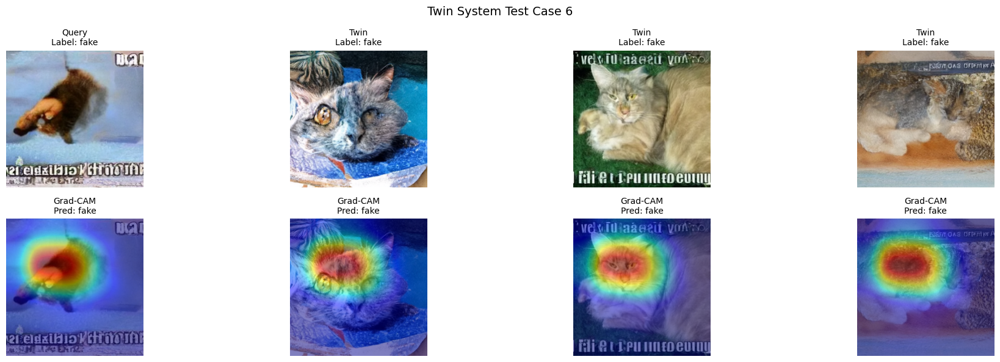

In [13]:
show_twin_system_twins_only(
    test_idx=6,
    test_embeddings=test_embeddings,
    test_images=test_images,
    train_embeddings=train_embeddings,
    train_labels=train_labels,
    train_images=train_images,
    model=model_cat,
    class_names=['fake', 'real'],
    k_twins=3  # how many similar same-class examples to retrieve
)


In [64]:
print(f"Fake classified as Real: {misclassified_fake_as_real}")
print(f"Real classified as Fake: {misclassified_real_as_fake}")

Fake classified as Real: [57, 77, 80]
Real classified as Fake: [13, 18, 22, 34, 40, 44]


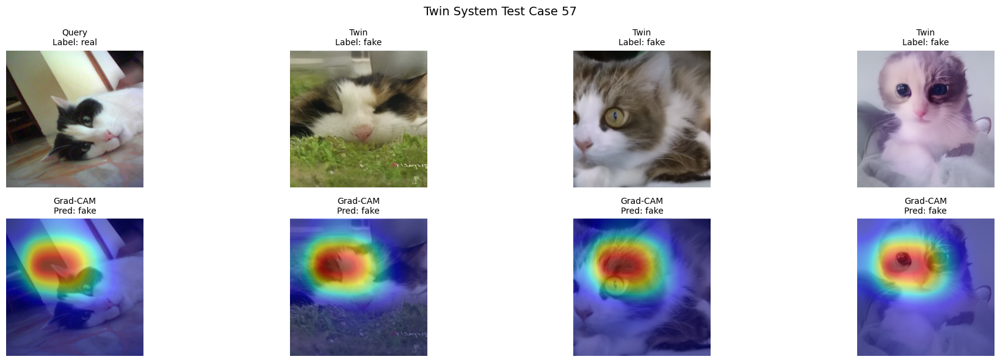

In [14]:
show_twin_system_twins_only(
    test_idx=57,
    test_embeddings=test_embeddings,
    test_images=test_images,
    train_embeddings=train_embeddings,
    train_labels=train_labels,
    train_images=train_images,
    model=model_cat,
    class_names=['fake', 'real'],
    k_twins=3  # how many similar same-class examples to retrieve
)


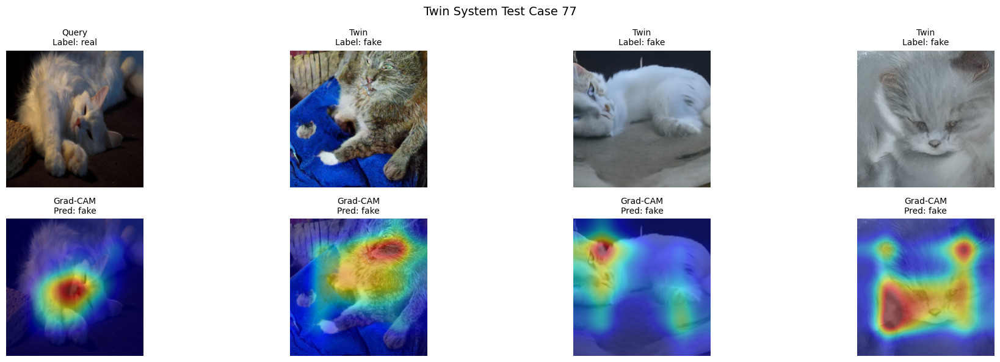

In [66]:
show_twin_system_twins_only(
    test_idx=77,
    test_embeddings=test_embeddings,
    test_images=test_images,
    train_embeddings=train_embeddings,
    train_labels=train_labels,
    train_images=train_images,
    model=model_cat,
    class_names=['fake', 'real'],
    k_twins=3  # how many similar same-class examples to retrieve
)


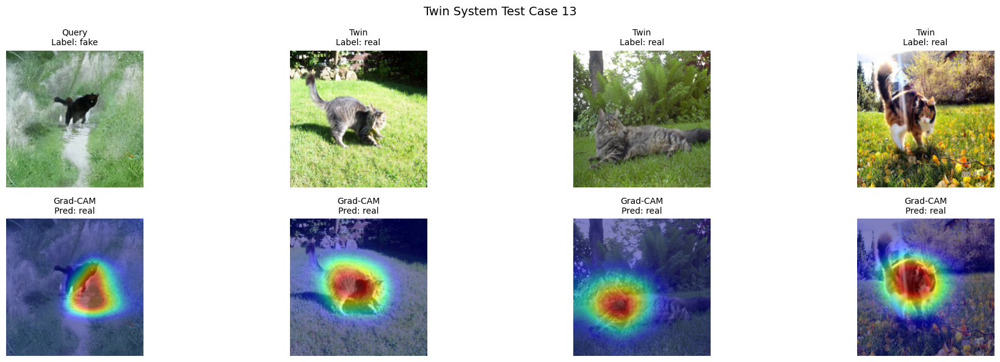

In [67]:
show_twin_system_twins_only(
    test_idx=13,
    test_embeddings=test_embeddings,
    test_images=test_images,
    train_embeddings=train_embeddings,
    train_labels=train_labels,
    train_images=train_images,
    model=model_cat,
    class_names=['fake', 'real'],
    k_twins=3  # how many similar same-class examples to retrieve
)


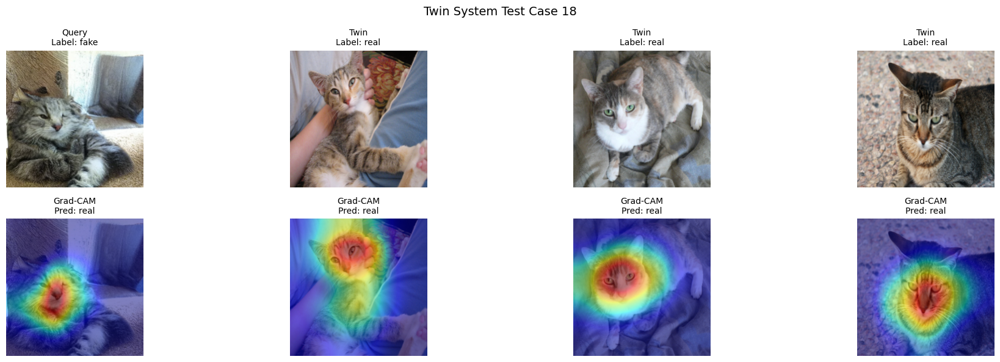

In [68]:
show_twin_system_twins_only(
    test_idx=18,
    test_embeddings=test_embeddings,
    test_images=test_images,
    train_embeddings=train_embeddings,
    train_labels=train_labels,
    train_images=train_images,
    model=model_cat,
    class_names=['fake', 'real'],
    k_twins=3  # how many similar same-class examples to retrieve
)


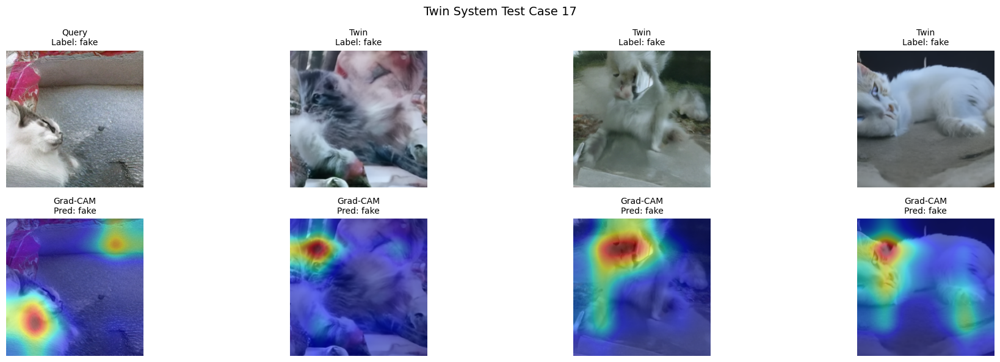

In [69]:
show_twin_system_twins_only(
    test_idx=17,
    test_embeddings=test_embeddings,
    test_images=test_images,
    train_embeddings=train_embeddings,
    train_labels=train_labels,
    train_images=train_images,
    model=model_cat,
    class_names=['fake', 'real'],
    k_twins=3  # how many similar same-class examples to retrieve
)


In [35]:
import torch
import torch.nn as nn
import torchvision.models as models

class ProtoPNet(nn.Module):
    def __init__(self, base_arch='resnet18', num_prototypes_per_class=10, num_classes=2):
        super().__init__()
        self.num_classes = num_classes
        self.num_prototypes_per_class = num_prototypes_per_class
        self.num_prototypes = num_classes * num_prototypes_per_class

        # Backbone CNN (ResNet18 without avgpool and fc)
        backbone = models.resnet18(pretrained=True)
        self.feature_extractor = nn.Sequential(*list(backbone.children())[:-2])  # output: B x 512 x 7 x 7

        # Prototype layer
        self.prototype_vectors = nn.Parameter(
            torch.rand(self.num_prototypes, 512, 1, 1), requires_grad=True
        )

        # Fully connected layer for classification
        self.last_layer = nn.Linear(self.num_prototypes, num_classes, bias=False)

    def _l2_dist(self, x, proto):
        # x: B x C x H x W, proto: m x C x 1 x 1
        x2 = torch.sum(x ** 2, dim=1, keepdim=True)  # B x 1 x H x W
        p2 = torch.sum(proto ** 2, dim=1).view(-1, 1, 1)  # m x 1 x 1
        xp = nn.functional.conv2d(x, proto)  # B x m x H x W
        return x2 - 2 * xp + p2.unsqueeze(0)  # Broadcast to B x m x H x W


    def forward(self, x):
        features = self.feature_extractor(x)  # B x D x H x W
        dists = self._l2_dist(features, self.prototype_vectors)  # B x m x H x W
        sims = -torch.min(dists.view(dists.size(0), self.num_prototypes, -1), dim=2)[0]  # B x m
        logits = self.last_layer(sims)  # B x num_classes
        return logits, sims, dists

# Instantiate model
protopnet_model = ProtoPNet(num_prototypes_per_class=10, num_classes=2)
protopnet_model.to("cuda" if torch.cuda.is_available() else "cpu")


ProtoPNet(
  (feature_extractor): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running

In [36]:
def train_protopnet(model, train_loader, val_loader, epochs=10):
    model.train()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

    for epoch in range(epochs):
        total_loss = 0
        for inputs, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()

            logits, sims, _ = model(inputs)
            loss = criterion(logits, labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        print(f"📘 Epoch {epoch+1}: Avg Train Loss = {total_loss/len(train_loader):.4f}")


In [37]:
def project_prototypes(model, loader):
    model.eval()
    max_activations = torch.full((model.num_prototypes,), -1e10).to(device)
    best_patches = torch.zeros_like(model.prototype_vectors.data)

    with torch.no_grad():
        for inputs, _ in loader:
            inputs = inputs.to(device)
            features = model.feature_extractor(inputs)
            for i in range(model.num_prototypes):
                proto = model.prototype_vectors[i].unsqueeze(0)
                dists = model._l2_dist(features, proto)
                sims = -torch.min(dists.view(dists.size(0), -1), dim=1)[0]
                max_val, max_idx = sims.max(0)

                if max_val > max_activations[i]:
                    max_activations[i] = max_val
                    best_patch = features[max_idx].unsqueeze(0)
                    model.prototype_vectors.data[i] = nn.functional.adaptive_avg_pool2d(best_patch, (1, 1))

    print("✅ Prototypes projected to most activating training patches.")


In [38]:
train_protopnet(protopnet_model, train_loader, val_loader, epochs=10)


Epoch 1/10: 100%|██████████| 7/7 [00:00<00:00,  8.57it/s]


📘 Epoch 1: Avg Train Loss = 100.8390


Epoch 2/10: 100%|██████████| 7/7 [00:00<00:00,  8.70it/s]


📘 Epoch 2: Avg Train Loss = 62.6102


Epoch 3/10: 100%|██████████| 7/7 [00:00<00:00,  9.27it/s]


📘 Epoch 3: Avg Train Loss = 50.1834


Epoch 4/10: 100%|██████████| 7/7 [00:00<00:00,  8.90it/s]


📘 Epoch 4: Avg Train Loss = 42.1457


Epoch 5/10: 100%|██████████| 7/7 [00:00<00:00,  9.11it/s]


📘 Epoch 5: Avg Train Loss = 38.0246


Epoch 6/10: 100%|██████████| 7/7 [00:00<00:00,  8.82it/s]


📘 Epoch 6: Avg Train Loss = 35.4620


Epoch 7/10: 100%|██████████| 7/7 [00:00<00:00,  8.49it/s]


📘 Epoch 7: Avg Train Loss = 33.0999


Epoch 8/10: 100%|██████████| 7/7 [00:00<00:00,  8.63it/s]


📘 Epoch 8: Avg Train Loss = 30.8790


Epoch 9/10: 100%|██████████| 7/7 [00:00<00:00,  8.77it/s]


📘 Epoch 9: Avg Train Loss = 29.1059


Epoch 10/10: 100%|██████████| 7/7 [00:00<00:00,  8.85it/s]

📘 Epoch 10: Avg Train Loss = 27.8859


📊 Classification Report:
              precision    recall  f1-score   support

        real       0.50      1.00      0.67        50
        fake       0.00      0.00      0.00        50

    accuracy                           0.50       100
   macro avg       0.25      0.50      0.33       100
weighted avg       0.25      0.50      0.33       100



/home/aj3246/TRITON/.venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/aj3246/TRITON/.venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/aj3246/TRITON/.venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


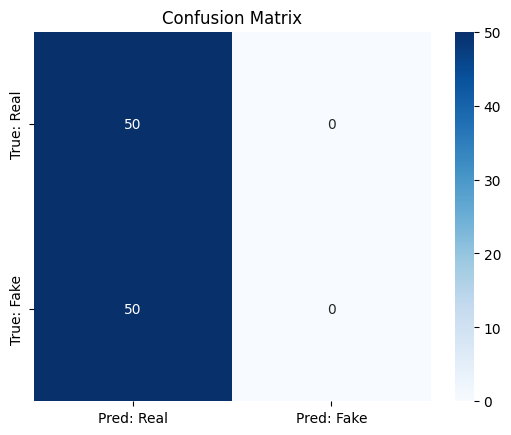

In [43]:
def evaluate_protopnet_model(model, val_loader):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            logits, _, _ = model(inputs)
            _, preds = torch.max(logits, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    print("📊 Classification Report:")
    print(classification_report(all_labels, all_preds, target_names=['real', 'fake']))

    cm = confusion_matrix(all_labels, all_preds)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Pred: Real', 'Pred: Fake'],
                yticklabels=['True: Real', 'True: Fake'])
    plt.title("Confusion Matrix")
    plt.show()

# Run it
evaluate_protopnet_model(protopnet_model, val_loader)


In [40]:
project_prototypes(protopnet_model, train_loader)


✅ Prototypes projected to most activating training patches.


In [41]:
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image

def visualize_prototypes(model, loader, k=5):
    model.eval()
    patch_size = 224  # input size

    proto_imgs = [None] * model.num_prototypes
    proto_scores = [-1e10] * model.num_prototypes

    with torch.no_grad():
        for inputs, _ in loader:
            inputs = inputs.to(device)
            features = model.feature_extractor(inputs)
            for b in range(inputs.size(0)):
                for i in range(model.num_prototypes):
                    proto = model.prototype_vectors[i].unsqueeze(0)
                    dists = model._l2_dist(features[b:b+1], proto)
                    sim = -torch.min(dists.view(1, -1)).item()
                    if sim > proto_scores[i]:
                        proto_scores[i] = sim
                        proto_imgs[i] = inputs[b].cpu()

    # Plot top-activating patches
    ncols = 5
    nrows = (model.num_prototypes + ncols - 1) // ncols
    plt.figure(figsize=(ncols * 3, nrows * 3))
    for i in range(model.num_prototypes):
        plt.subplot(nrows, ncols, i + 1)
        img = proto_imgs[i] * 0.5 + 0.5  # unnormalize
        img = torch.clamp(img, 0, 1)
        plt.imshow(to_pil_image(img))
        plt.title(f"Prototype {i}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()


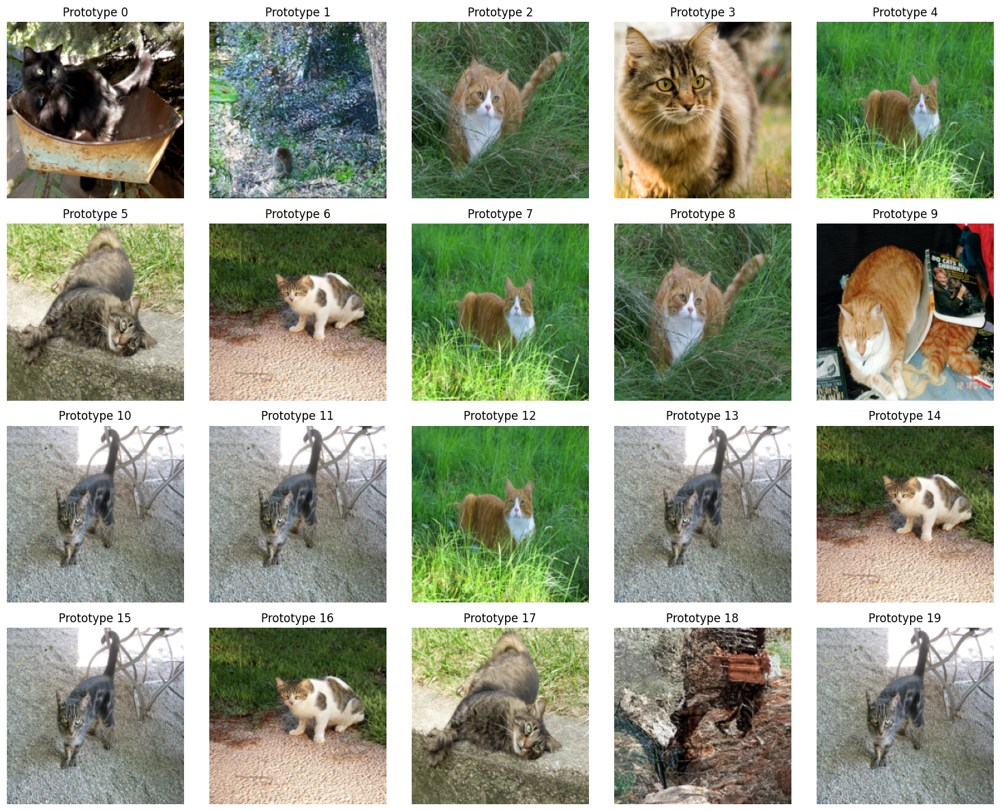

In [42]:
visualize_prototypes(protopnet_model, train_loader)
